# Transport & Safety - Enhancing Pedestrian Experiences, Road Crossing Safety, and Accident Prevention in Melbourne

## Authored by:  Kruthi Shetty

**Duration:** 120 mins <br>
**Level:** Intermediate <br>
**Pre-requisite Skills:** Python, Data Engineering and Analysis

### Scenario

**As an elderly person my main priority is to move through Melbourne's streets safely, especially while crossing roadways. To ensure my wellbeing and confidence in travelling around, I hope the city would take my particular requirements and worries into consideration.** <br>
Personal safety is a pedestrian's main worry when navigating the city, especially when they have to cross roadways. Elderly pedestrians in particular want the city to implement modifications and enhancements that would enhance their general sense of wellbeing and confidence while they move. They want an urban environment that takes their safety concerns and needs into consideration, especially when it comes to crossing roadways. They want to be able to walk about the city with confidence and a sense of security.

**As a council ensuring the safety of our residents is a key concern, we are dedicated to investing in traffic safety programmes that have a real and noticeable impact on lowering collisions, injuries, and deaths. We must constantly evaluate how well our present methods for designing the road network are working and see if they are in line with our safety objectives.** <br>
The council is aware that seniors face specific demands and difficulties while traversing city streets, notably at junctions and when crossing streets. Reduced mobility, slower walking rates, and possible sensory impairments are only a few of these difficulties. The council is aware that it is crucial to address road safety from the standpoint of an elderly person. The creation of an inclusive and accessible urban environment is under the purview of the council. The council can plan and implement infrastructure upgrades that increase safety and accessibility by taking into account the worries and needs of older pedestrians.

**What Will This Use Case Teach You?**

At the end of this use case you will:
- Learn how to import the dataset into a Pandas dataframe from different sources.
- Understand how to clean the data by eliminating any pointless columns and dealing with missing values, and organise data in the format needed for visualization.
- Learn how to visualize by utilizing libraries like Matplotlib, Seaborn, or Folium (for interactive maps) to create heatmaps.
- Use the data to create heatmaps to plot the density of pedestrian accidents, traffic intersections, and other relevant data points on the map to visualize high-risk areas and accident hotspots.

### Introduction

Melbourne's streets and landmarks are a draw for both visitors and locals since they are located in the centre of a thriving urban dynamic and cultural variety. However, in the middle of all this urban activity, pedestrian safety must come first. In order to improve pedestrian experiences and address the urgent problem of road safety, this use case combines data science with urban design. All pedestrians, particularly the elderly, should feel safe and confident when navigating the streets, especially when crossing roads. Keeping efficient traffic flow and pedestrian safety in balance is a difficult task that calls for a multifaceted strategy.

In this use case, we set out on a data-driven quest to understand pedestrian incidents, pinpoint accident hotspots, and provide suggestions for practical road safety improvements. This study shows how pedestrian age has a substantial impact on accident rates, leading us to consider creative solutions like the Singaporean practise. The idea of giving the elderly and disabled the ability to touch a card on the traffic signal to extend the crossing time has opportunities for improving pedestrian safety.

Pedestrians over 65 years of age are involved in a higher number of crashes because they:

Have more difficulty judging the speed and distance of traffic accurately, as eyesight and hearing begin to decline. 
May not move or react quickly to avoid approaching vehicles.

### Datasets List

- Pedestrian Counting System (counts per hour)
- VicRoads Accident data
- Traffic Signal Data
- Traffic Volume Data

<b>Contents</b>

1. Import important Libraries
2. Connect, Test and Analysis of Datasets
    - 2.1. Pedestrian Counting System (counts per hour)
    - 2.2. VicRoads Accident data
    - 2.3. VicRoads Traffic Signal Data
    - 2.4. VicRoads Traffic Volume Data
3. Combining all Visualisations and Data
4. Findings & Opportunities
5. Conclusions
6. Thank You!

<div class="usecase-section-header">1. Import important Libraries</div>

In [1]:
# Standard
import os
import json

# Data import
import requests

# Data manipulation
import pandas as pd


# Plotting 
import plotly.graph_objs as go
import plotly.express as px
import folium
import folium.plugins as plugins


/Users/kruthishetty/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


<div class="usecase-section-header"> 2. Connect, Test and Analysis of Datasets</div>

We must utilise the v2.1 of their API in order to connect to the [Melbourne Open Data Portal](https://data.melbourne.vic.gov.au/) and collect data. In this way, a custom URL is made using the distinct dataset id (often the name that appears below after /datasets/).

In [2]:
#Pedestrian Counting System (counts per hour)

Ped_count_url= 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/pedestrian-counting-system-monthly-counts-per-hour/exports/json?limit=-1&offset=0&timezone=UTC'
r = requests.get(Ped_count_url)
response = r.json()
Ped_count = pd.DataFrame(response)



In [3]:
# Print details of data
print(f'The shape of the dataset is:{Ped_count.shape}')
print()
print('The first ten rows of this dataset are:')

# Print the first 10 rows of data
Ped_count.head(10)

The shape of the dataset is:(281567, 5)

The first ten rows of this dataset are:


,timestamp,locationid,direction_1,direction_2,total_of_directions
0,2023-08-30T16:00:00+00:00,1,12,18,30
1,2023-08-30T22:00:00+00:00,1,288,238,526
2,2023-08-30T23:00:00+00:00,1,313,372,685
3,2023-08-31T02:00:00+00:00,1,1270,1001,2271
4,2023-08-31T09:00:00+00:00,1,630,414,1044
5,2023-08-31T10:00:00+00:00,1,433,315,748
6,2023-08-31T11:00:00+00:00,1,310,207,517
7,2023-08-31T13:00:00+00:00,1,54,64,118
8,2023-08-31T14:00:00+00:00,1,38,36,74
9,2023-08-30T14:00:00+00:00,2,4,17,21


As we can see, each record is described by 5 fields 
The following fields can be divided up for each record:

**timestamp:** The date and time of the pedestrian count are shown in this column. It will be essential for examining pedestrian activity trends over time and maybe linking accident data.

**locationid:** This column specifies the precise place where the pedestrian count was made. This makes it easier to identify pedestrian hotspots and provide suggestions for safety improvements since it enables you to link pedestrian counts with various city locations.

**direction_1:** This column shows the number of people walking in the first direction, such as along one side of the street or across a crosswalk.

**direction_2:** This column shows the number of people walking in the other direction, such as across the street or across a crosswalk.

**total_of_directions:** This column shows the aggregate total of pedestrians travelling in both directions. This can be used as a general indicator of foot traffic in the area.

In order to provide insightful data and visuals regarding each dataset, we will now study each one separately. This will help us later on when creating interactive maps and forecasts.

#### 2.1 Pedestrian Counting System (counts per hour)

**By presenting the first five rows of the dataset, let's first review it.**

**Let's first review the dataset by displaying the first five rows of the dataset.**

In [4]:
Ped_count.head(5)

,timestamp,locationid,direction_1,direction_2,total_of_directions
0,2023-08-30T16:00:00+00:00,1,12,18,30
1,2023-08-30T22:00:00+00:00,1,288,238,526
2,2023-08-30T23:00:00+00:00,1,313,372,685
3,2023-08-31T02:00:00+00:00,1,1270,1001,2271
4,2023-08-31T09:00:00+00:00,1,630,414,1044


In [5]:
# Convert timestamp to datetime format
Ped_count['timestamp'] = pd.to_datetime(Ped_count['timestamp'])

# Extract day of the week and time of day
Ped_count['day_of_week'] = Ped_count['timestamp'].dt.dayofweek
Ped_count['hour'] = Ped_count['timestamp'].dt.hour

**Let us rename the total_direction column for better user experience.**

In [6]:
# Rename the 'total_of_directions' column to 'total_pedestrian_count'
Ped_count.rename(columns={'total_of_directions': 'total_pedestrian_count'}, inplace=True)

**Let us drop the redundant columns**

In [7]:
# Drop 'direction_1' and 'direction_2' columns from the DataFrame
Ped_count.drop(columns=['direction_1', 'direction_2'], inplace=True)


**Let's Visualize Number of Features by Pedestrian count.**

In [8]:
Ped_count

,timestamp,locationid,total_pedestrian_count,day_of_week,hour
0,2023-08-30 16:00:00+00:00,1,30,2,16
1,2023-08-30 22:00:00+00:00,1,526,2,22
2,2023-08-30 23:00:00+00:00,1,685,2,23
3,2023-08-31 02:00:00+00:00,1,2271,3,2
4,2023-08-31 09:00:00+00:00,1,1044,3,9
...,...,...,...,...,...
281562,2023-09-23 07:00:00+00:00,123,564,5,7
281563,2023-09-23 08:00:00+00:00,123,38,5,8
281564,2023-09-23 09:00:00+00:00,123,3,5,9
281565,2023-09-23 11:00:00+00:00,123,1,5,11


In [9]:
# Check for missing values in the Ped_count DataFrame
missing_values = Ped_count.isnull().sum()

# Display the count of missing values for each column
print(missing_values)


timestamp                 0
locationid                0
total_pedestrian_count    0
day_of_week               0
hour                      0
dtype: int64


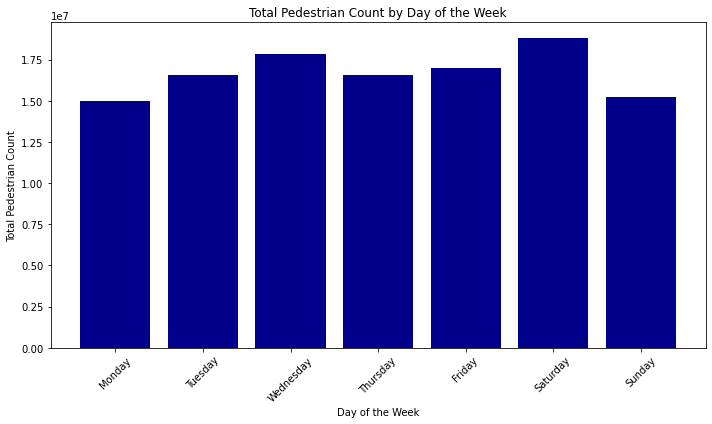

In [10]:
import matplotlib.pyplot as plt
# Group the data by day of the week and calculate the sum of total_pedestrian_count
pedestrian_counts_by_day = Ped_count.groupby('day_of_week')['total_pedestrian_count'].sum()

# Define the names for days of the week (0 = Monday, 6 = Sunday)
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(day_names, pedestrian_counts_by_day, color='darkblue')
plt.xlabel('Day of the Week')
plt.ylabel('Total Pedestrian Count')
plt.title('Total Pedestrian Count by Day of the Week')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()




**2.2. VicRoads Accident data- crash stats**

In [11]:
import requests
from io import BytesIO
from zipfile import ZipFile

url = 'https://vicroadsopendatastorehouse.vicroads.vic.gov.au/opendata/Road_Safety/ACCIDENT.zip'
content = requests.get(url)

# Checking if the request was successful
if content.status_code == 200:
    # Creating a list of CSV files to extract
    csv_files_to_extract = ['ACCIDENT.csv', 'PERSON.csv', 'NODE.csv', 'ACCIDENT_EVENT.csv', 'ACCIDENT_LOCATION.csv', 'SUBDCA.csv', 'ROAD_SURFACE_COND.csv']

    # Unzip the content
    with ZipFile(BytesIO(content.content)) as zip_file:
        # Loop through the files in the ZIP archive
        for file_name in zip_file.namelist():
            # Check if the file is one of the CSV files you want to extract
            if file_name in csv_files_to_extract:
                # Extract the file to the current directory
                zip_file.extract(file_name)

    print('Selected CSV files extracted successfully.')

# If the request was not successful, handle the error accordingly
else:
    print('Failed to retrieve the ZIP file.')


Selected CSV files extracted successfully.


In [12]:
import pandas as pd
import os

# Define columns to drop from each CSV file
columns_to_drop = {
    'ACCIDENT.csv': ['Day Week Description', 'ACCIDENT_TYPE', 'DIRECTORY', 'EDITION', 'LIGHT_CONDITION', 'NODE_ID', 'NO_PERSONS_KILLED', 'NO_PERSONS_NOT_INJ', 'POLICE_ATTEND', 'ROAD_GEOMETRY', 'Road Geometry Desc', 'SEVERITY', 'SPEED_ZONE' ],
    'PERSON.csv': ['ACCIDENT_NO', 'VEHICLE_ID', 'INJ_LEVEL', 'SEATING_POSITION', 'HELMET_BELT_WORN', 'ROAD_USER_TYPE', 'LICENCE_STATE', 'EJECTED_CODE'],
    'NODE.csv': ['ACCIDENT_NO', 'NODE_ID', 'NODE_TYPE', 'VICGRID94_X', 'VICGRID94_Y', 'LGA_NAME_ALL', 'REGION_NAME'],
    'ACCIDENT_EVENT.csv': ['ACCIDENT_NO', 'EVENT_SEQ_NO', 'EVENT_TYPE', 'VEHICLE_1_ID', 'VEHICLE_1_COLL_PT', 'Vehicle 1 Coll Pt Desc', 'VEHICLE_2_ID', 'VEHICLE_2_COLL_PT', 'Vehicle 2 Coll Pt Desc', 'PERSON_ID', 'OBJECT_TYPE'],
    'ACCIDENT_LOCATION.csv': ['ACCIDENT_NO', 'NODE_ID', 'ROAD_ROUTE_1', 'ROAD_TYPE_INT', 'DISTANCE_LOCATION', 'DIRECTION_LOCATION', 'NEAREST_KM_POST', 'OFF_ROAD_LOCATION'],
    'SUBDCA.csv' : ['Sub Dca Code Desc'],
    'ROAD_SURFACE_COND.csv' : ['Surface Cond Desc']
    # Add more CSV files and columns to drop as needed
}

# Initialize an empty list to store DataFrames
data_frames = []

# Loop through each CSV file and get information
for file_name in csv_files_to_extract:
    try:
        # Check if this file has columns to drop
        if file_name in columns_to_drop:
            # Load the CSV file into a Pandas DataFrame
            df = pd.read_csv(file_name)
            # Drop the specified columns
            df.drop(columns=columns_to_drop[file_name], inplace=True)
        else:
            # Load the CSV file without dropping columns
            df = pd.read_csv(file_name)
        
        # Append the DataFrame to the list
        data_frames.append(df)
    except FileNotFoundError:
        print(f"File not found: {file_name}")
    except Exception as e:
        print(f"Error processing {file_name}: {e}")

# Concatenate all DataFrames into a single DataFrame

accident_pedestrians = pd.concat(data_frames, axis =1)
accident_pedestrians.info()


/var/folders/nm/ntbwszps2j377flx0d25z84w0000gn/T/ipykernel_46276/2886532505.py:25: DtypeWarning: Columns (10,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_name)
/var/folders/nm/ntbwszps2j377flx0d25z84w0000gn/T/ipykernel_46276/2886532505.py:25: DtypeWarning: Columns (6,9,10,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_name)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 490948 entries, 0 to 490947
Data columns (total 40 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ACCIDENT_NO           203708 non-null  object 
 1   ACCIDENTDATE          203708 non-null  object 
 2   ACCIDENTTIME          203708 non-null  object 
 3   Accident Type Desc    203708 non-null  object 
 4   DAY_OF_WEEK           203708 non-null  float64
 5   DCA_CODE              203708 non-null  float64
 6   DCA Description       203708 non-null  object 
 7   PAGE                  201360 non-null  object 
 8   GRID_REFERENCE_X      201360 non-null  object 
 9   GRID_REFERENCE_Y      201360 non-null  object 
 10  Light Condition Desc  203708 non-null  object 
 11  NO_OF_VEHICLES        203708 non-null  float64
 12  NO_PERSONS            203708 non-null  float64
 13  NO_PERSONS_INJ_2      203708 non-null  float64
 14  NO_PERSONS_INJ_3      203708 non-null  float64
 15  

In [13]:
import pandas as pd
import re
import numpy as np

# Remove extra spaces and irregularities from ACCIDENTTIME using regex
accident_pedestrians['ACCIDENTTIME'] = accident_pedestrians['ACCIDENTTIME'].apply(lambda x: re.sub(r'\s+', ' ', str(x)).strip())

# Combine ACCIDENTDATE and ACCIDENTTIME and parse as datetime
accident_pedestrians['DATETIME'] = pd.to_datetime(accident_pedestrians['ACCIDENTDATE'] + ' ' + accident_pedestrians['ACCIDENTTIME'], format='%d/%m/%Y %H:%M:%S')

# Create new features from the accident date variable
accident_pedestrians['NUMDayOfWeek'] = accident_pedestrians['DATETIME'].dt.strftime('%w')
accident_pedestrians['NUMWeekOfYear'] = accident_pedestrians['DATETIME'].dt.strftime('%W')
accident_pedestrians['NUMDayOfYear'] = accident_pedestrians['DATETIME'].dt.strftime('%j')
accident_pedestrians['NUMYearOfAcc'] = accident_pedestrians['DATETIME'].dt.strftime('%Y')

# Clean up text white space in the DCA Description variable
accident_pedestrians['DCA Description'] = accident_pedestrians['DCA Description'].str.rstrip()

# Create and apply a group mapping for the hour of accident
hour_mapping = {
    '00': 'Early Morning', '01': 'Early Morning', '02': 'Early Morning', '03': 'Early Morning', '04': 'Early Morning',
    '05': 'Early Morning', '06': 'Morning', '07': 'Morning', '08': 'Morning', '09': 'Late Morning', '10': 'Late Morning',
    '11': 'Late Morning', '12': 'Early Afternoon', '13': 'Early Afternoon', '14': 'Early Afternoon', '15': 'Late Afternoon',
    '16': 'Late Afternoon', '17': 'Evening', '18': 'Evening', '19': 'Evening', '20': 'Night', '21': 'Night', '22': 'Night',
    '23': 'Night'
}
accident_pedestrians['hourgroup'] = accident_pedestrians['DATETIME'].dt.strftime('%H').map(hour_mapping)

# Convert all categorical variables to strings

categorical_columns =  ['Accident Type Desc', 'DAY_OF_WEEK', 'DCA Description', 'PAGE', 'GRID_REFERENCE_X', 'GRID_REFERENCE_Y',
                       'Light Condition Desc', 'SEX', 'Age Group', 'Inj Level Desc', 'Road User Type Desc', 'PEDEST_MOVEMENT',
                       'TAKEN_HOSPITAL', 'LGA_NAME', 'DEG_URBAN_NAME','POSTCODE', 'POSTCODE_NO',  'Event Type Desc', 'Object Type Desc', 'ROAD_NAME',
                       'ROAD_TYPE', 'ROAD_NAME_INT', 'SUB_DCA_CODE', 'SURFACE_COND']

accident_pedestrians[categorical_columns] = accident_pedestrians[categorical_columns].astype(str)


# Replace non-integer values with NaN in numerical columns
numerical_columns = ['DCA_CODE', 'NO_OF_VEHICLES', 'NO_PERSONS', 'NO_PERSONS_INJ_2', 'NO_PERSONS_INJ_3',
                     'AGE', 'SUB_DCA_SEQ', 'SURFACE_COND', 'SURFACE_COND_SEQ']
accident_pedestrians[numerical_columns] = accident_pedestrians[numerical_columns].apply(pd.to_numeric, errors='coerce')

# Convert numerical columns to integers, handling missing values
accident_pedestrians[numerical_columns] = accident_pedestrians[numerical_columns].fillna(0).astype(int)

# Create a new feature by concatenating ROAD_NAME and ROAD_TYPE
accident_pedestrians['CATAccidentRoadGroup'] = accident_pedestrians['ROAD_NAME'].fillna('') + ' ' + accident_pedestrians['ROAD_TYPE'].fillna('')

# Print the information summary for the cleaned dataset
print(accident_pedestrians.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 490948 entries, 0 to 490947
Data columns (total 47 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   ACCIDENT_NO           203708 non-null  object        
 1   ACCIDENTDATE          203708 non-null  object        
 2   ACCIDENTTIME          490948 non-null  object        
 3   Accident Type Desc    490948 non-null  object        
 4   DAY_OF_WEEK           490948 non-null  object        
 5   DCA_CODE              490948 non-null  int64         
 6   DCA Description       490948 non-null  object        
 7   PAGE                  490948 non-null  object        
 8   GRID_REFERENCE_X      490948 non-null  object        
 9   GRID_REFERENCE_Y      490948 non-null  object        
 10  Light Condition Desc  490948 non-null  object        
 11  NO_OF_VEHICLES        490948 non-null  int64         
 12  NO_PERSONS            490948 non-null  int64         
 13 

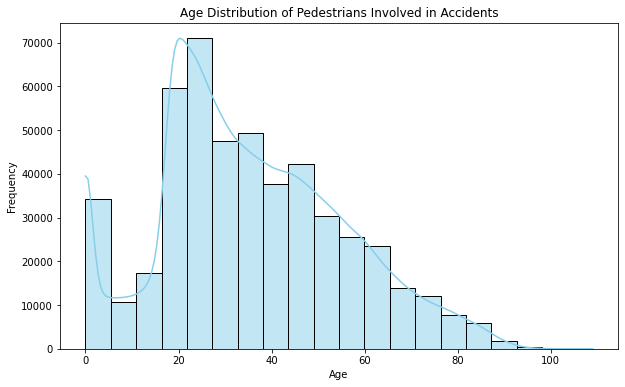

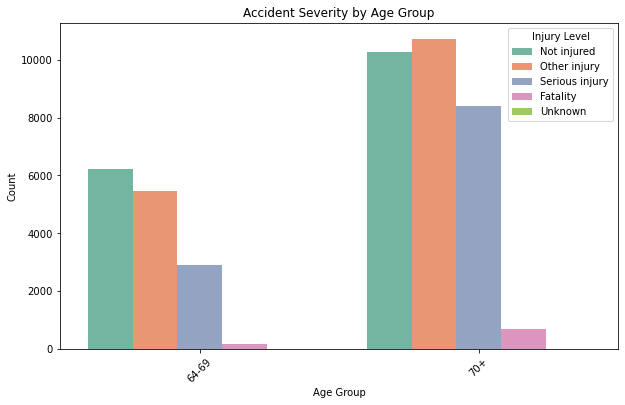

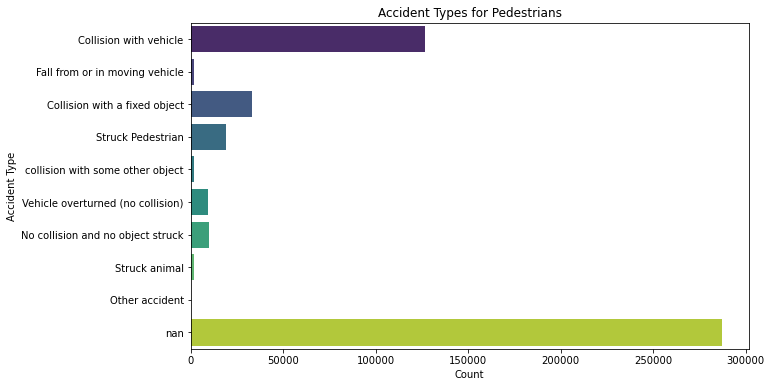

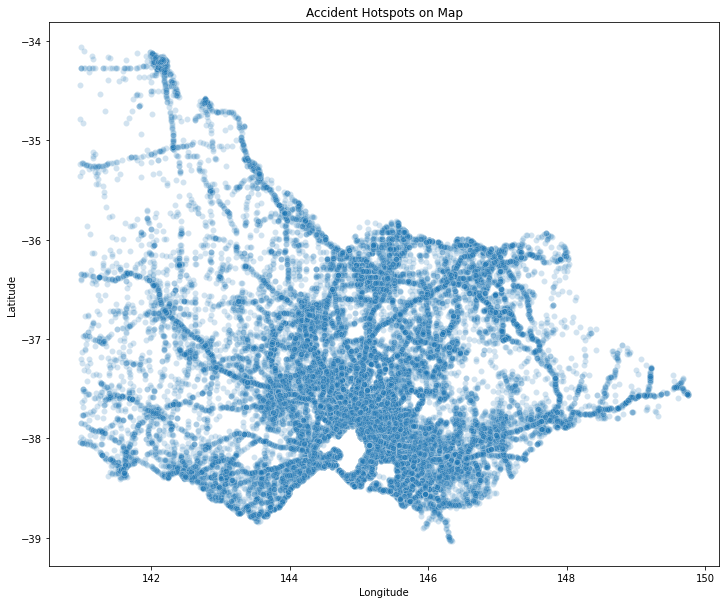

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

age_groups_order = ['64-69', '70+' ]

# 1. Age Distribution of Pedestrians Involved in Accidents (Histogram)
plt.figure(figsize=(10, 6))
sns.histplot(data=accident_pedestrians, x='AGE', bins=20, kde=True, color='skyblue')
plt.title('Age Distribution of Pedestrians Involved in Accidents')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

# 2. Accident Severity by Age Group (Bar Chart)
plt.figure(figsize=(10, 6))
sns.countplot(data=accident_pedestrians, x='Age Group', hue='Inj Level Desc', order=age_groups_order,
              palette='Set2')
plt.title('Accident Severity by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.legend(title='Injury Level', loc='upper right')
plt.xticks(rotation=45)
plt.show()

# 3. Accident Types for Pedestrians (Bar Chart)
plt.figure(figsize=(10, 6))
sns.countplot(data=accident_pedestrians, y='Accident Type Desc', palette='viridis')
plt.title('Accident Types for Pedestrians')
plt.xlabel('Count')
plt.ylabel('Accident Type')
plt.show()


# 4. Accident Hotspots (Scatter Plot on Map - Geospatial Plot)
plt.figure(figsize=(12, 10))
sns.scatterplot(data=accident_pedestrians, x='Long', y='Lat', alpha=0.2)
plt.title('Accident Hotspots on Map')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()



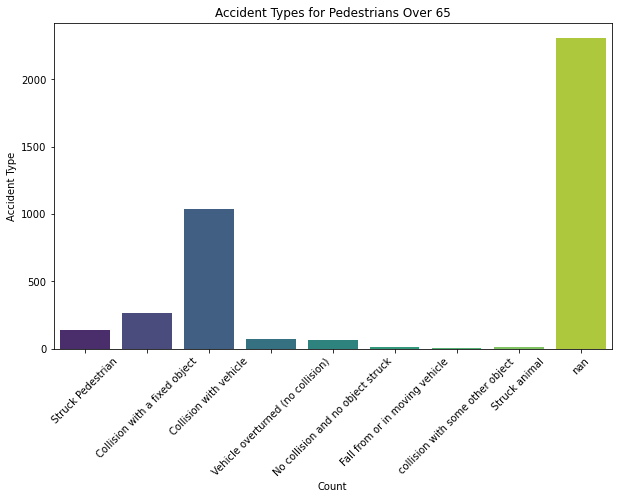

In [15]:
# Filter the data to include only pedestrians
pedestrian_data = accident_pedestrians[accident_pedestrians['Road User Type Desc'] == 'Pedestrians']

# Filter the pedestrian data to include only pedestrians over the age of 65
pedestrians_over_65 = pedestrian_data[(pedestrian_data['Age Group'] == '64-69') | (pedestrian_data['Age Group'] == '70+')]

# Check if there is data for pedestrians over 65
if not pedestrians_over_65.empty:
    # Create a bar chart to visualize accident types for pedestrians over 65
    plt.figure(figsize=(10, 6))
    sns.countplot(data=pedestrians_over_65, x='Accident Type Desc', palette='viridis')
    plt.title('Accident Types for Pedestrians Over 65')
    plt.xlabel('Count')
    plt.ylabel('Accident Type')
    plt.xticks(rotation=45)
    plt.show()
else:
    print("No data available for pedestrians over the age of 65.")

**2.3. Traffic Signal Data**

In [16]:
import geopandas as gpd

# URL of the GeoJSON file
url2 = "https://vicroadsopendata-vicroadsmaps.opendata.arcgis.com/datasets/1f3cb954526b471596dbffa30e56bb32_0.geojson?outSR=%7B%22latestWkid%22%3A3111%2C%22wkid%22%3A102171%7D"

# Read the GeoJSON file from the URL into a GeoDataFrame
traffic_lights = gpd.read_file(url2)

# Now, 'gdf' contains your spatial data as a GeoDataFrame
traffic_lights

,OBJECTID,TLIGHTS_,TLIGHTS_ID,SITE_NO,SITE_NAME,SITE_TYPE,DIRECTORY,DIR_REF,D_ADDED,D_TOWNS,D_EDITED,D_REMOVED,LINK_MODE,STATUS,COMMENTS,MULTI,UFI,ARC_UFI,geometry
0,45042,NaN,NaN,5168,BARWON HEADS ROAD/WARALILY BVD,INT,,,NaN,NaN,NaN,NaN,NaN,OPERATIONAL,,NaN,NaN,NaN,POINT (144.37788 -38.23666)
1,45043,NaN,NaN,2015,MELBOURNE NR HOBART (KNOX CITY),POS,,,NaN,NaN,NaN,NaN,NaN,OPERATIONAL,,NaN,NaN,NaN,POINT (145.24197 -37.86925)
2,45044,NaN,NaN,6273,MITCHELL/QUEEN,INT,,,NaN,NaN,NaN,NaN,NaN,OPERATIONAL,,NaN,NaN,NaN,POINT (144.28034 -36.76131)
3,45045,NaN,NaN,520,MOOROODUC/SAGES,INT,,,NaN,NaN,NaN,NaN,NaN,OPERATIONAL,Bluetooth,NaN,NaN,NaN,POINT (145.13371 -38.19567)
4,45046,NaN,NaN,3629,CHURCHILL NR BRAYBROOK COMMUNITY CENTRE,POS,,,NaN,NaN,NaN,NaN,NaN,OPERATIONAL,,NaN,NaN,NaN,POINT (144.85338 -37.78613)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4847,49889,NaN,NaN,5335,PRINCES HIGHWAY WEST/HESSE STREET,INT,,,NaN,NaN,NaN,NaN,NaN,OPERATIONAL,,NaN,NaN,NaN,POINT (144.32642 -38.21496)
4848,49890,NaN,NaN,5336,PRINCES HWY WEST/DEANS MARSH RD/MURRELL,INT,,,NaN,NaN,NaN,NaN,NaN,OPERATIONAL,,NaN,NaN,NaN,POINT (144.32642 -38.21496)
4849,49891,NaN,NaN,2996,MELROSE DRIVE/GRANTS ROAD/CENTRE ROAD,INT,,,NaN,NaN,NaN,NaN,NaN,OPERATIONAL,Bluetooth,NaN,NaN,NaN,POINT (144.85216 -37.67554)
4850,49892,NaN,NaN,1559,Mornington Peninsula Fwy/Nepean Hwy,INT,,,NaN,NaN,NaN,NaN,NaN,OPERATIONAL,"METER,UPS",NaN,NaN,NaN,POINT (144.99103 -38.33009)


In [17]:
# Access latitude and longitude from the 'geometry' column
traffic_lights['latitude'] = traffic_lights['geometry'].y
traffic_lights['longitude'] = traffic_lights['geometry'].x
#Dropping the unwanted columns
columns_to_drop = ['TLIGHTS_', 'TLIGHTS_ID', 'DIRECTORY', 'DIR_REF', 'D_ADDED', 'D_TOWNS', 'D_EDITED', 'D_REMOVED', 'LINK_MODE', 'MULTI', 'UFI', 'ARC_UFI', 'geometry']
traffic_lights.drop(columns=columns_to_drop, inplace= True )


In [18]:
traffic_lights

,OBJECTID,SITE_NO,SITE_NAME,SITE_TYPE,STATUS,COMMENTS,latitude,longitude
0,45042,5168,BARWON HEADS ROAD/WARALILY BVD,INT,OPERATIONAL,,-38.236657,144.377875
1,45043,2015,MELBOURNE NR HOBART (KNOX CITY),POS,OPERATIONAL,,-37.869250,145.241974
2,45044,6273,MITCHELL/QUEEN,INT,OPERATIONAL,,-36.761312,144.280339
3,45045,520,MOOROODUC/SAGES,INT,OPERATIONAL,Bluetooth,-38.195666,145.133709
4,45046,3629,CHURCHILL NR BRAYBROOK COMMUNITY CENTRE,POS,OPERATIONAL,,-37.786134,144.853384
...,...,...,...,...,...,...,...,...
4847,49889,5335,PRINCES HIGHWAY WEST/HESSE STREET,INT,OPERATIONAL,,-38.214960,144.326416
4848,49890,5336,PRINCES HWY WEST/DEANS MARSH RD/MURRELL,INT,OPERATIONAL,,-38.214960,144.326416
4849,49891,2996,MELROSE DRIVE/GRANTS ROAD/CENTRE ROAD,INT,OPERATIONAL,Bluetooth,-37.675543,144.852164
4850,49892,1559,Mornington Peninsula Fwy/Nepean Hwy,INT,OPERATIONAL,"METER,UPS",-38.330091,144.991029


In [19]:
# Group data by SITE_TYPE and count the occurrences
site_type_counts = traffic_lights['SITE_TYPE'].value_counts().reset_index()
site_type_counts.columns = ['SITE_TYPE', 'count']

# Create a pie chart using Plotly Express
fig = px.pie(site_type_counts, names='SITE_TYPE', values='count', title='Distribution of SITE_TYPE')
fig.show()

**2.4. Traffic Volume Data**

In [20]:
import pandas as pd

# URL of the CSV file
url3 = "https://vicroadsopendata-vicroadsmaps.opendata.arcgis.com/datasets/5512df2ff41e4941bacf868053dbfba9_0.csv?outSR=%7B%22latestWkid%22%3A3111%2C%22wkid%22%3A102171%7D"

# Read the CSV file from the URL
traffic_volume = pd.read_csv(url3)


traffic_volume

,OBJECTID_1,OBJECTID,TIS_ID,HMGNS_FLOW_ID,HMGNS_LNK_ID,HMGNS_LNK_DESC,LGA_SHORT_NM,RGN_LONG_NM,ROAD_NBR,DECLARED_ROAD_NM,...,TWO_WAY_AADT_TRUCKS,ALLVEH_AMPEAK_AADT,ALLVEH_PMPEAK_AADT,GROWTH_RATE,CI,AM_PEAK_SPEED,OFF_PEAK_SPEED,PM_PEAK_SPEED,YR,LABEL
0,1,743,14915,14915,2006,MARYSVILLE-WOODS POINT ROAD btwn LAKE MOUNTAI...,YARRA RANGES,METROPOLITAN SOUTH EAST REGION,4961,MARYSVILLE-WOODS POINT ROAD,...,0.0,NaN,NaN,0.013,0.005,NaN,NaN,NaN,2020,24* (13% 3*) EAST BOUND
1,2,650,14140,14140,8786,STEELS CREEK ROAD btwn WILLOWBEND DRIVE & ELT...,YARRA RANGES,METROPOLITAN SOUTH EAST REGION,9999,Not Applicable,...,40.0,NaN,NaN,0.019,0.002,NaN,NaN,NaN,2020,373* (6% 22*) NORTH BOUND
2,3,701,12113,12113,6035,LATROBE ROAD btwn TANJIL EAST ROAD & GORDON S...,LATROBE,EASTERN REGION,5911,MORWELL-YALLOURN NORTH ROAD,...,160.0,NaN,NaN,0.015,0.009,NaN,NaN,NaN,2020,"1,100* (6% 61*) NORTH BOUND"
3,4,702,12897,12897,7079,CASTERTON ROAD btwn GLENELG HIGHWAY & COLERAI...,SOUTHERN GRAMPIANS,SOUTH WESTERN REGION,2670,GLENELG HIGHWAY,...,340.0,NaN,NaN,0.020,0.001,NaN,NaN,NaN,2020,801* (21% 165*) WEST BOUND
4,5,703,9893,9893,3475,HUTTON ROAD btwn CHAPEL ROAD & GREENS ROAD,DANDENONG,METROPOLITAN SOUTH EAST REGION,5168,BRAESIDE-DANDENONG ROAD,...,1500.0,1000.0,1100.0,0.003,0.002,NaN,NaN,NaN,2020,"12,000 (6% 744*) WEST BOUND"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14669,14670,33800,16426,16426,8864,WENTWORTH STREET BTWN SOUTH GIPPSLAND HIGHWAY ...,CASEY,METROPOLITAN SOUTH EAST REGION,0,Not Applicable,...,NaN,NaN,NaN,0.030,0.003,NaN,NaN,NaN,2020,"4,000* (N/A) EAST BOUND"
14670,14671,33809,16440,16440,3371,BALLARTO RD BTWN POTTS RD AND MCCORMICKS RD,FRANKSTON,METROPOLITAN SOUTH EAST REGION,5152,BALLARTO ROAD,...,1500.0,950.0,563.0,0.016,0.002,NaN,NaN,NaN,2020,"7,900 (8% 656*) WEST BOUND"
14671,14672,33405,16401,16401,1367,ALEXANDRA PDE BTWN GOLD ST AND HODDLE ST,YARRA,METROPOLITAN NORTH WEST REGION,8002,2830F 2080B,...,250.0,NaN,NaN,0.001,0.002,NaN,NaN,NaN,2020,"2,400* (5% 126*) EAST BOUND"
14672,14673,33406,16402,16402,1367,ALEXANDRA PDE BTWN GOLD ST AND HODDLE ST,YARRA,METROPOLITAN NORTH WEST REGION,8002,2830F 2080B,...,250.0,NaN,NaN,0.001,0.002,NaN,NaN,NaN,2020,"2,400* (5% 126*) EAST BOUND"


In [21]:

# List of columns to keep
columns_to_keep = ['HMGNS_LNK_DESC','ROAD_NBR', 'DECLARED_ROAD_NM', 'ALLVEH_AMPEAK_AADT', 'ALLVEH_PMPEAK_AADT', 'AM_PEAK_SPEED', 'OFF_PEAK_SPEED', 'PM_PEAK_SPEED','GROWTH_RATE',  'YR', 'LABEL']

# Remove unwanted columnsALLVEH_AMPEAK_AADT
traffic_volume = traffic_volume[columns_to_keep]

traffic_volume


,HMGNS_LNK_DESC,ROAD_NBR,DECLARED_ROAD_NM,ALLVEH_AMPEAK_AADT,ALLVEH_PMPEAK_AADT,AM_PEAK_SPEED,OFF_PEAK_SPEED,PM_PEAK_SPEED,GROWTH_RATE,YR,LABEL
0,MARYSVILLE-WOODS POINT ROAD btwn LAKE MOUNTAI...,4961,MARYSVILLE-WOODS POINT ROAD,NaN,NaN,NaN,NaN,NaN,0.013,2020,24* (13% 3*) EAST BOUND
1,STEELS CREEK ROAD btwn WILLOWBEND DRIVE & ELT...,9999,Not Applicable,NaN,NaN,NaN,NaN,NaN,0.019,2020,373* (6% 22*) NORTH BOUND
2,LATROBE ROAD btwn TANJIL EAST ROAD & GORDON S...,5911,MORWELL-YALLOURN NORTH ROAD,NaN,NaN,NaN,NaN,NaN,0.015,2020,"1,100* (6% 61*) NORTH BOUND"
3,CASTERTON ROAD btwn GLENELG HIGHWAY & COLERAI...,2670,GLENELG HIGHWAY,NaN,NaN,NaN,NaN,NaN,0.020,2020,801* (21% 165*) WEST BOUND
4,HUTTON ROAD btwn CHAPEL ROAD & GREENS ROAD,5168,BRAESIDE-DANDENONG ROAD,1000.0,1100.0,NaN,NaN,NaN,0.003,2020,"12,000 (6% 744*) WEST BOUND"
...,...,...,...,...,...,...,...,...,...,...,...
14669,WENTWORTH STREET BTWN SOUTH GIPPSLAND HIGHWAY ...,0,Not Applicable,NaN,NaN,NaN,NaN,NaN,0.030,2020,"4,000* (N/A) EAST BOUND"
14670,BALLARTO RD BTWN POTTS RD AND MCCORMICKS RD,5152,BALLARTO ROAD,950.0,563.0,NaN,NaN,NaN,0.016,2020,"7,900 (8% 656*) WEST BOUND"
14671,ALEXANDRA PDE BTWN GOLD ST AND HODDLE ST,8002,2830F 2080B,NaN,NaN,NaN,NaN,NaN,0.001,2020,"2,400* (5% 126*) EAST BOUND"
14672,ALEXANDRA PDE BTWN GOLD ST AND HODDLE ST,8002,2830F 2080B,NaN,NaN,NaN,NaN,NaN,0.001,2020,"2,400* (5% 126*) EAST BOUND"


In [22]:
# Rename the "DECLARED_ROAD_NM" column to "Road_Name"
traffic_volume.rename(columns={'DECLARED_ROAD_NM': 'ROAD_NAME'}, inplace=True)
traffic_volume.rename(columns={'YR': 'Year'}, inplace=True)

/var/folders/nm/ntbwszps2j377flx0d25z84w0000gn/T/ipykernel_46276/1108220500.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/nm/ntbwszps2j377flx0d25z84w0000gn/T/ipykernel_46276/1108220500.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Average Growth of Traffic on different roads

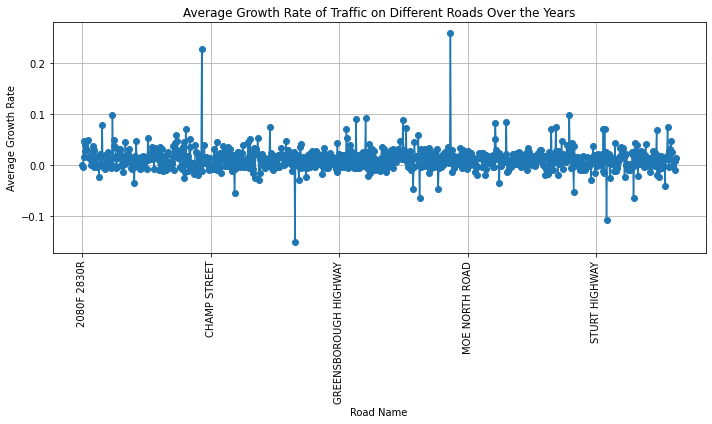

In [23]:
# Group the data by Road_Name and calculate the average growth rate
road_growth_data = traffic_volume.groupby('ROAD_NAME')['GROWTH_RATE'].mean()

# Create a line plot
plt.figure(figsize=(10, 6))
road_growth_data.plot(kind='line', marker='o')
plt.title('Average Growth Rate of Traffic on Different Roads Over the Years')
plt.xlabel('Road Name')
plt.ylabel('Average Growth Rate')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()


**After going through pre-processing and feature engineering, the datasets are now prepared for additional analysis.**

### 3. Combining all Visualisations and Data

In [24]:
import pandas as pd

# Filter the data to include only pedestrians
pedestrian_data = accident_pedestrians[accident_pedestrians['Road User Type Desc'] == 'Pedestrians']

# Filter the pedestrian data to include only pedestrians over the age of 65
pedestrians_over_65 = pedestrian_data[(pedestrian_data['Age Group'] == '64-69') | (pedestrian_data['Age Group'] == '70+')]

# Select relevant columns from the pedestrian_data DataFrame
selected_pedestrian_data = pedestrians_over_65[['Lat', 'Long', 'ROAD_NAME', 'NUMYearOfAcc', 'Age Group']]

# Rename columns to match those in the Ped_count dataset
selected_pedestrian_data = selected_pedestrian_data.rename(columns={'Lat': 'latitude', 'Long': 'longitude', 'ROAD_NAME': 'Road Name', 'NUMYearOfAcc': 'Year'})

# Create a list of additional columns from traffic_lights and traffic_volume datasets to add
selected_traffic_lights = ['SITE_NAME', 'STATUS', 'SITE_TYPE']
selected_traffic_volume = ['ALLVEH_AMPEAK_AADT', 'ALLVEH_PMPEAK_AADT', 'GROWTH_RATE']

# Concatenate selected_pedestrian_data and additional columns as separate columns
combined_data = pd.concat([selected_pedestrian_data] + [Ped_count[['total_pedestrian_count']]] + [traffic_lights[selected_traffic_lights]] + [traffic_volume[selected_traffic_volume]], axis=1)

# Include 'IsPedestrian' column and set it to True for pedestrian-related data
combined_data['Pedestrian'] = True

# Display the resulting combined DataFrame
combined_data.head()


,latitude,longitude,Road Name,Year,Age Group,total_pedestrian_count,SITE_NAME,STATUS,SITE_TYPE,ALLVEH_AMPEAK_AADT,ALLVEH_PMPEAK_AADT,GROWTH_RATE,Pedestrian
267,-37.811005,145.237372,BEACH,2006,64-69,400.0,THOMPSON NR VISTULA,OPERATIONAL,POS,NaN,NaN,-0.008,True
452,-38.066280,145.467279,COLAC-FORREST,2006,70+,1849.0,GILBERT/REGENT,OPERATIONAL,INT,1000.0,1100.0,0.019,True
897,-37.848228,144.977528,YORK,2006,70+,3030.0,EASTERN NR GOLD (WEST BOUND),OPERATIONAL,POS,NaN,NaN,0.019,True
960,-37.875055,144.718164,BELL,2006,70+,137.0,DERRIMUT/BAGGOTT,OPERATIONAL,INT,NaN,NaN,0.026,True
1081,-37.932947,145.034514,MAIN,2006,70+,170.0,HIGH (MCIVOR HWY)/SHORT,OPERATIONAL,INT,NaN,NaN,0.001,True


In [25]:
combined_df_cleaned = combined_data.fillna('N.A')
combined_df_cleaned

,latitude,longitude,Road Name,Year,Age Group,total_pedestrian_count,SITE_NAME,STATUS,SITE_TYPE,ALLVEH_AMPEAK_AADT,ALLVEH_PMPEAK_AADT,GROWTH_RATE,Pedestrian
267,-37.811005,145.237372,BEACH,2006,64-69,400.0,THOMPSON NR VISTULA,OPERATIONAL,POS,N.A,N.A,-0.008,True
452,-38.06628,145.467279,COLAC-FORREST,2006,70+,1849.0,GILBERT/REGENT,OPERATIONAL,INT,1000.0,1100.0,0.019,True
897,-37.848228,144.977528,YORK,2006,70+,3030.0,EASTERN NR GOLD (WEST BOUND),OPERATIONAL,POS,N.A,N.A,0.019,True
960,-37.875055,144.718164,BELL,2006,70+,137.0,DERRIMUT/BAGGOTT,OPERATIONAL,INT,N.A,N.A,0.026,True
1081,-37.932947,145.034514,MAIN,2006,70+,170.0,HIGH (MCIVOR HWY)/SHORT,OPERATIONAL,INT,N.A,N.A,0.001,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
281562,N.A,N.A,N.A,N.A,N.A,564.0,N.A,N.A,N.A,N.A,N.A,N.A,True
281563,N.A,N.A,N.A,N.A,N.A,38.0,N.A,N.A,N.A,N.A,N.A,N.A,True
281564,N.A,N.A,N.A,N.A,N.A,3.0,N.A,N.A,N.A,N.A,N.A,N.A,True
281565,N.A,N.A,N.A,N.A,N.A,1.0,N.A,N.A,N.A,N.A,N.A,N.A,True


**Visualizing a Map with Traffic Signals and Pedestrians over 64-65 and 70+.**


In [26]:
import folium
import math

# Filter out rows with missing or invalid latitude and longitude values
combined_df_cleaned = combined_df_cleaned[(combined_df_cleaned['latitude'] != 'N.A') & (combined_df_cleaned['longitude'] != 'N.A')]

# Create a base map
m = folium.Map(location=[-37.811005, 145.237372], zoom_start=20, width='100%', height='100%')

# Define an offset for pedestrian markers to avoid overlap with traffic signals
pedestrian_offset = 0.0001  # You can adjust this value as needed

for index, row in combined_df_cleaned.iterrows():
    lat = float(row['latitude'])
    lon = float(row['longitude'])
    year = row['Year']
    pedestrian_count = row['total_pedestrian_count']
    site_name = row['SITE_NAME']

    # Check if the incident involves pedestrians over 70
    if row['Age Group'] == '70+':
        # Create a pop-up label for incidents involving pedestrians over 70
        popup = f"Year: {year}<br>Location: {row['Road Name']}<br>Pedestrian Count: {pedestrian_count}<br>Age Group: 70+"
        # Use a different icon or marker style for these incidents
        icon_color = 'red'  # Choose a suitable color
        icon_html = f'<i class="fa fa-user" style="color: {icon_color}; font-size: 24px;"></i>'

        # Add the pedestrian marker to the map with an offset
        folium.Marker(
            [lat + pedestrian_offset, lon + pedestrian_offset],
            popup=folium.Popup(popup, max_width=300),
            icon=folium.DivIcon(html=icon_html)
        ).add_to(m)
    elif row['Age Group'] == '64-69':
        # Create a pop-up label for incidents involving pedestrians in the age group "64-69"
        popup = f"Year: {year}<br>Location: {row['Road Name']}<br>Pedestrian Count: {pedestrian_count}<br>Age Group: 64-69"
        # Use blue color for this age group
        icon_color = 'blue'  # Choose a suitable color
        icon_html = f'<i class="fa fa-user" style="color: {icon_color}; font-size: 24px;"></i>'
        
        # Add the pedestrian marker to the map with an offset
        folium.Marker(
            [lat + pedestrian_offset, lon + pedestrian_offset],
            popup=folium.Popup(popup, max_width=300),
            icon=folium.DivIcon(html=icon_html)
        ).add_to(m)
    else:
        # For other age groups, use a default style
        popup = f"Year: {year}<br>Location: {row['Road Name']}<br>Pedestrian Count: {pedestrian_count}"
        icon_color = 'black'  # Default color
        icon_html = f'<i class="fa fa-user" style="color: {icon_color}; font-size: 24px;"></i>'
        
        # Add the pedestrian marker to the map with an offset
        folium.Marker(
            [lat + pedestrian_offset, lon + pedestrian_offset],
            popup=folium.Popup(popup, max_width=300),
            icon=folium.DivIcon(html=icon_html)
        ).add_to(m)
        

def euclidean_distance(lat1, lon1, lat2, lon2):
    # Radius of the Earth in kilometers
    radius = 6371.0
    
    # Convert latitude and longitude from degrees to radians
    lat1 = math.radians(lat1)
    lon1 = math.radians(lon1)
    lat2 = math.radians(lat2)
    lon2 = math.radians(lon2)
    
    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    distance = radius * c
    
    return distance

       
 # Add traffic signals to the map
for index, row in traffic_lights.iterrows():
    lat_signal = float(row['latitude'])
    lon_signal = float(row['longitude'])
    site_name = row['SITE_NAME']
    
    # Customize the marker color and icon for traffic signals
    icon_color = 'green'  # Traffic signals are shown in green
    icon_html = f'<i class="fa fa-traffic-light" style="color: {icon_color}; font-size: 24px;"></i>'
    
    # Check if there's a person above 70+ near the specific traffic signal
    if any(ped_age == '70+' and euclidean_distance(lat_signal, lon_signal, ped_lat, ped_lon) < 0.0001 for ped_lat, ped_lon, ped_age in zip(combined_df_cleaned['latitude'], combined_df_cleaned['longitude'], combined_df_cleaned['Age Group'])):
        # Create a pop-up label with the "old man holding a stick" symbol
        popup = f"Traffic Signal: {site_name}<br><i class= 'fa fa-blind' style='color: green; font-size: 24px;'></i><br>Time Extended up to 13 seconds"
    else:
        # Default pop-up label for other traffic signals
        popup = f"Traffic Signal: {site_name}"
    
    # Create a marker with popup for traffic signals (icon remains regular traffic signal)
    folium.Marker(
        [lat_signal, lon_signal],
        popup=folium.Popup(popup, max_width=300),
        icon=folium.DivIcon(html=icon_html)  # Use any default icon, you can change it to 'fa-traffic-light' for a traffic light symbol
    ).add_to(m)

# Display the map
m


We have developed an interactive map that displays incidences involving pedestrians who are older  and traffic signals. This map offers important information about driving safety. Locations of traffic signals are shown on the map, and each one is identified by a green traffic light icon.
Pedestrian occurrences: Markers on the map indicate where there have been pedestrian occurrences. .
Age Group 70+: Red icons that resemble elderly pedestrians who are over the age of 70, indicating greater vulnerability.
Age Group 64-69: Blue symbols are used to indicate incidents involving pedestrians aged 64 to 69.
**Clicking on a marker reveals detailed information about the incident, including the year, location, pedestrian count, and age group.
When a traffic light is clicked, a pop-up notification reveals whether there are any pedestrians older than 70 close by. If there are any such pedestrians, a green traffic signal icon and a message stating that the crossing time has been extended by 13 seconds to help them are displayed.**

### 4. Findings and Opportunities

- We have learned important information about pedestrian events, accident hotspots, and road safety issues through a data-driven approach. The strong effect of pedestrian age on accident rates is one important discovery. Accident risk is higher for pedestrians 65 and older. This susceptibility is due to issues including longer reaction times and a decreased capacity to effectively gauge the speed and distance of oncoming cars. We looked at creative answers that were modelled after Singaporean practises to overcome these problems. The implementation of a technology that allows elderly and disabled people to lengthen crossing times by merely pressing a card on the traffic signal is one such approach.

- We can analyse pedestrian incident data in depth to spot trends, taking into account elements like age, location, hour of the day, and weather. This investigation can provide additional light on the factors that contribute to pedestrian accident causes. Involve relevant stakeholders, including traffic safety authorities and advocacy groups for the elderly and disabled, in discussions and planning for road safety improvements. We can also, assess the technical and financial feasibility of implementing solutions like the touch card system for extending crossing times.

### 5. Conclusion

- In summary, efforts to improve traffic safety through data analysis have produced insightful information and prospects. In-depth analysis of pedestrian events has shown accident hotspots and opportunities for safety enhancement. Our study emphasises the important role that ageing has in affecting accident rates, especially for pedestrians over 65, due to factors like poorer judgement of traffic speed and distance.

- The suggested remedy presents a novel strategy and draws inspiration from international practises like Singapore's. It has the potential to dramatically increase pedestrian safety to allow elderly and disabled walkers to lengthen crossing durations with a simple card tap on traffic signals. We can significantly advance towards a safer and more pedestrian-friendly cityscape by working together and embracing creative solutions, which will eventually save lives and improve the quality of life for those who live in our neighbourhood.

### 6. Thank You.